In [1]:
import cv2 # tested with the 3.1.0 version
import numpy as np
import matplotlib.pyplot as plt
import os
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# 1. Basic Image Operations
## 1.1 Image Read/Write

OpenCV reads images as BGR and matplotlib uses RGB

In [3]:
# a) read image.
def my_imread(imagepath, key = -1):
    
    image = cv2.imread(imagepath,key) # Read the image from imagepath.
    return image

IMG_NAME = '14037.jpg' # Choose an image filename from "data/img/"
IMG_PATH = os.path.join('data/img/', IMG_NAME)
image = my_imread(IMG_PATH)

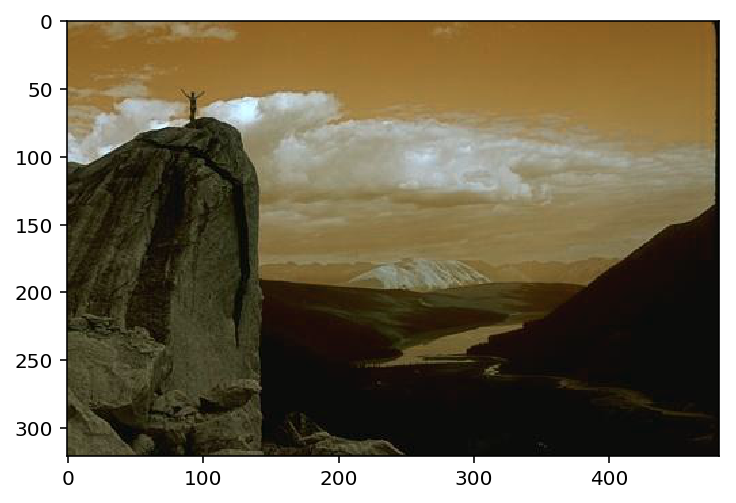

In [4]:
# How image looks when displayed in BGR format
plt.imshow(image)

In [5]:
# Converting BGR to RGB image
rgb_image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)

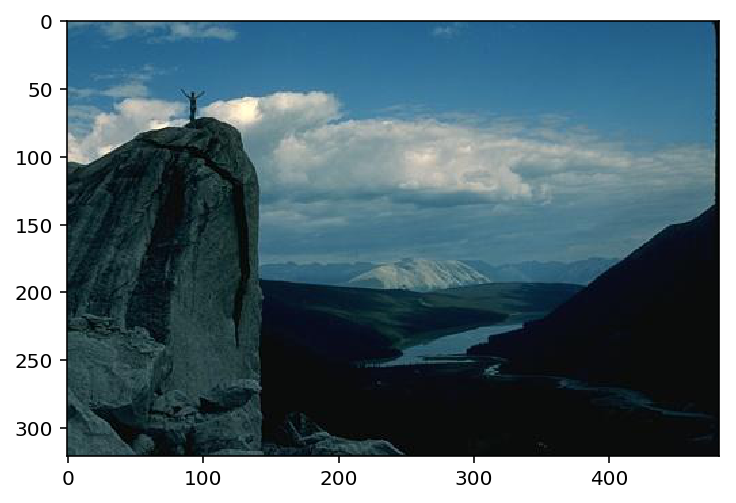

In [6]:
# b) Display the correct color in RGB 
plt.imshow(rgb_image) 

In [7]:
gray_image = my_imread(IMG_PATH,key = 0)

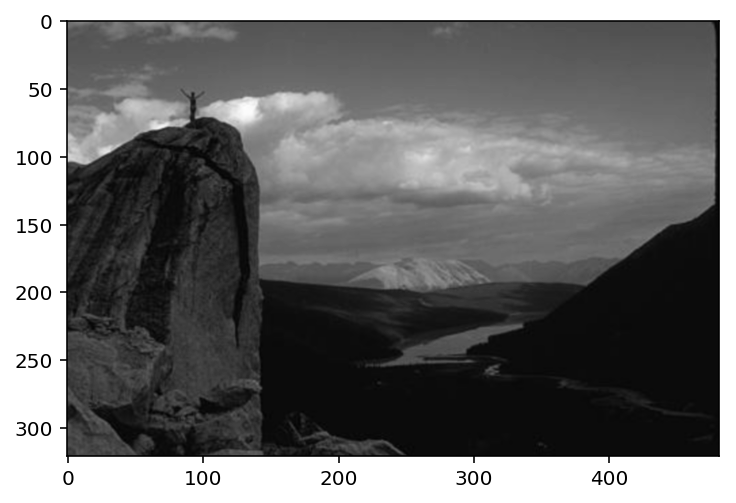

In [9]:
plt.imshow(gray_image, cmap = 'gray', interpolation='bicubic')

###### imwrite converts BGR to RGB under the hood

In [10]:
# c) Write the same image in the correct color and Grayscale and save as
# "problem1_rgb.jpg" and "problem1_gray.jpg".
RGB_FILENAME = "problem1_color.jpg"
GRAY_FILENAME = "problem1_gray.jpg"
cv2.imwrite(RGB_FILENAME,image) # save the image in the correct color format.
cv2.imwrite(GRAY_FILENAME,gray_image) # save the image in grayscale format.
# Once the two images have been generated in the current directory,
# run the next block to show your results.

True

### Display saved color image from current folder.
!["color"](problem1_color.jpg?arg)

### Display saved grayscale image from current folder.
!["gray"](problem1_gray.jpg?arg)

## 1.2 Image Smoothing

In [11]:
# Optional: plots an image
def plot_helper(rgb_img, title):
    plt.figure(figsize=(15, 15)) # the figure size can be adjusted to make sure the images are clear for grading.
    plt.subplot(111), 
    plt.imshow(rgb_img), 
    plt.title(title)
    plt.xticks([]), 
    plt.yticks([])
    plt.show()

In [12]:
def my_plot(images,fig_size = (20,20), main_title = None, cols = 2, titles = None):
    plt.figure(figsize=fig_size)
    plt.suptitle(main_title, size = 20)
    for i in range(len(images)):
        ax = plt.subplot(len(images)/2,cols,i+1)
        ax.axis('off')
        if titles: ax.set_title(titles[i], fontsize = 16)
        plt.imshow(images[i])

In [13]:
IMAGES = ['3096.jpg','8023.jpg','12084.jpg'] # choose 3 images from "data/img"
KERNEL_SIZES = [(5,5), (7,7), (9,9)] # choose at least 3 different filter sizes
print "kernel sizes are:", KERNEL_SIZES
avg_blurs = []
gaus_blurs = []
for i in range(len(IMAGES)):
    imagepath = os.path.join('data/img/', IMAGES[i])
    image = my_imread(imagepath)
    avg_blurs.append(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    gaus_blurs.append(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    for j in range(len(KERNEL_SIZES)):
        kernel_size = KERNEL_SIZES[j]
        # a) average smoothing
        avg_blur = cv2.blur(image,kernel_size)
        rgb_avg_blur = cv2.cvtColor(avg_blur, cv2.COLOR_BGR2RGB)
        avg_blurs.append(rgb_avg_blur)
        # b) gaussian smoothing
        gaus_blur = cv2.GaussianBlur(image,kernel_size,0)
        rgb_gaus_blur = cv2.cvtColor(gaus_blur,cv2.COLOR_BGR2RGB)
        gaus_blurs.append(rgb_gaus_blur)
    avg_stack = np.hstack(avg_blurs)
    gaus_stack = np.hstack(gaus_blurs)
    


    # Optional: you could choose to use plot_helper to plot avg_stack and gaus_stack.
    # Make sure they are in RGB before using plot_helper.

kernel sizes are: [(5, 5), (7, 7), (9, 9)]


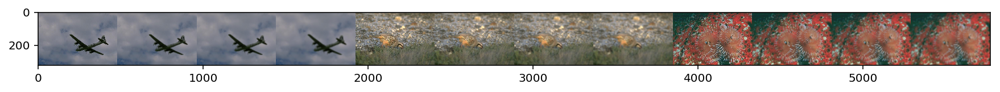

In [14]:
# Using my own plotting function because this is not clear
plt.figure(figsize = (15,15))
plt.imshow(avg_stack)

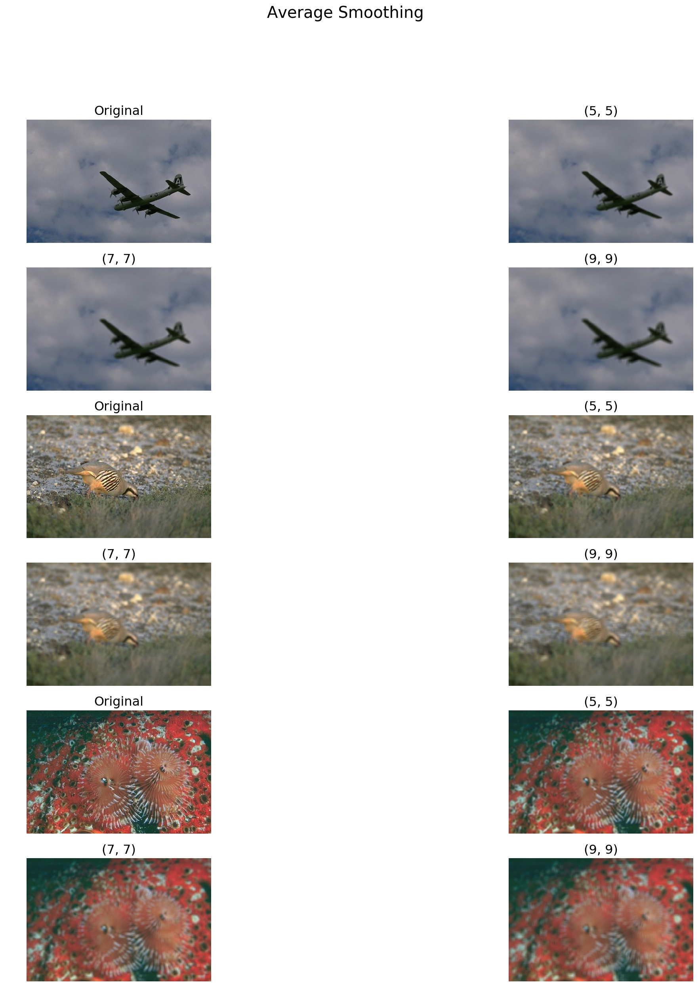

In [15]:
# Plotting using my function
titles = ['Original',(5,5), (7,7), (9,9)]
image_titles = titles*3
my_plot(avg_blurs, main_title='Average Smoothing',titles = image_titles)

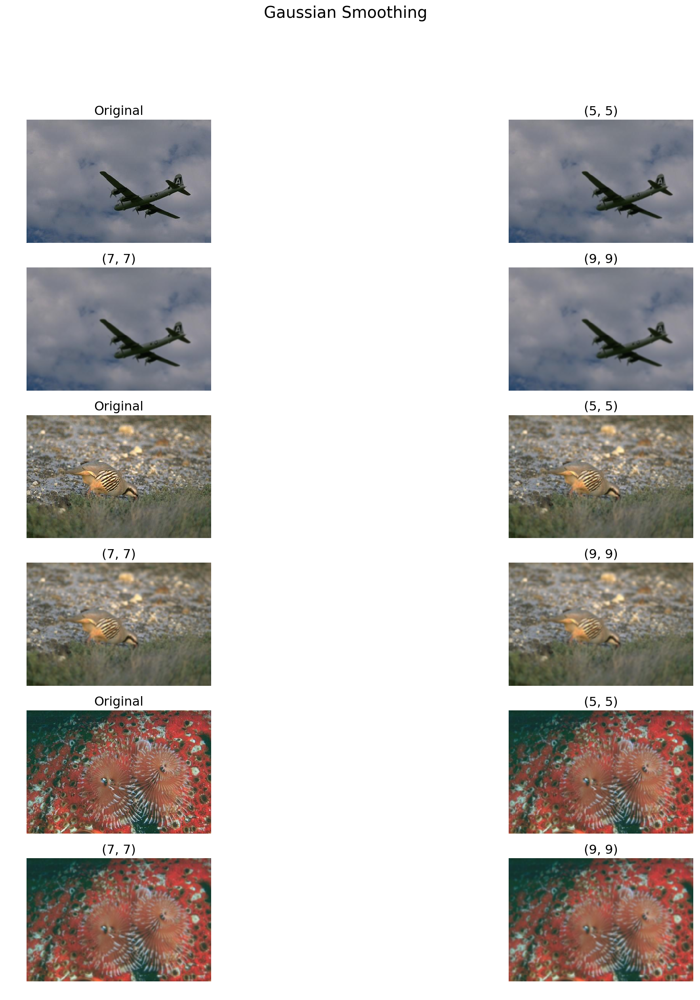

In [16]:
# Plotting using my function
titles = ['Original',(5,5), (7,7), (9,9)]
image_titles = titles*3
my_plot(gaus_blurs, main_title='Gaussian Smoothing',titles = image_titles)

### c) What do you observe? (Please briefly answer this question in this block)
The following are my observations: <br>
- Gaussian Filter seems to be more effective in smoothing the images compared to average filter. Both the filters make the image blurry but the image after applying gaussian filter is much more clearer than image after applying the average filter. <br>
- As the kernel size increases, image becomes less and less clear. This may be because it takes more and more neighbouring pixels into account to predict the value of the center pixel. 

## 1.3 Denoising

In [17]:
import glob
imagepaths = glob.glob('data/snp/*.jpg')

In [19]:
MEDIAN_FILTERS = [1, 3, 5, 7, 9] # Filter sizes for each image.
denoised_images = []
for i, imagepath in enumerate(imagepaths):
    image = my_imread(imagepath)
    denoised_images.append(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))
    median = cv2.medianBlur(image,MEDIAN_FILTERS[i]) # Apply the median filter on this image.
    denoised_images.append(cv2.cvtColor(median,cv2.COLOR_BGR2RGB))
    print "Filter size", MEDIAN_FILTERS[i]
    stack = np.hstack((image, median))
    # Optional: you could choose to use plot_helper to plot stacked image.
    # Make sure it is in RGB before using plot_helper.
    # plot_helper(____, 'Median Blur: %dx%d'%(MEDIAN_FILTERS[i], MEDIAN_FILTERS[i]))

Filter size 1
Filter size 3
Filter size 5
Filter size 7
Filter size 9


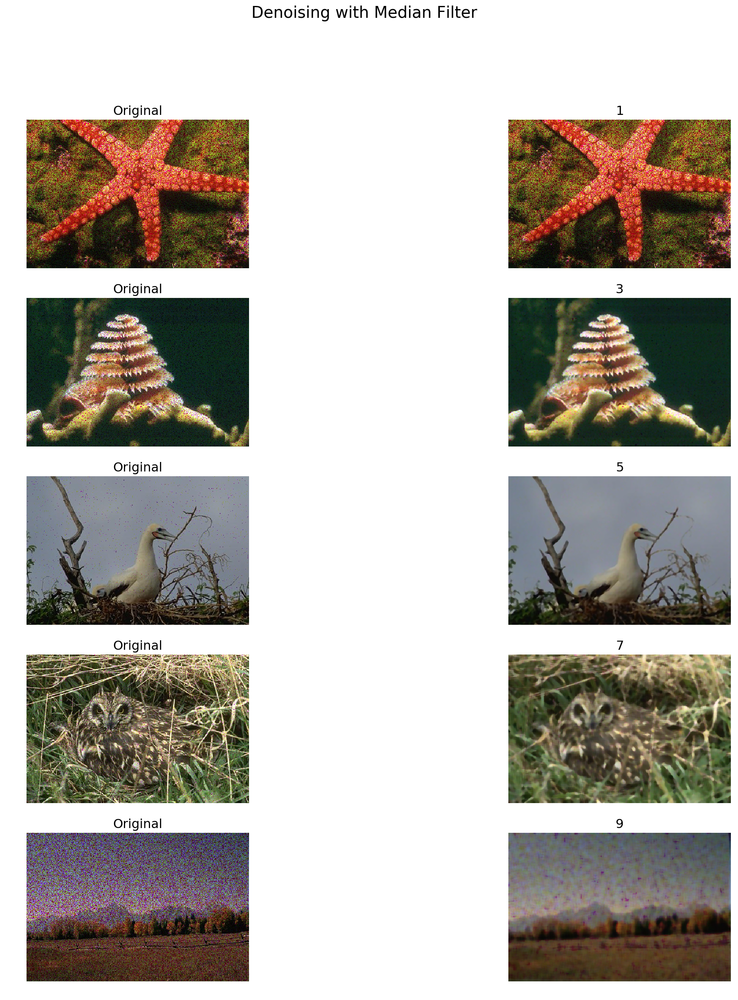

In [20]:
plot_titles = ['Original',1,'Original', 3,'Original', 5,'Original', 7,'Original', 9]
my_plot(denoised_images, main_title= 'Denoising with Median Filter', titles = plot_titles)

The following are my observations: <br>
1. As the ksize of the filter increases, the image becomes more and more blurry <br>
2. The last image has a lot of noise so it's the toughest one to filter <br>
3. The filter size of 5 gives the best results. Also the image it's used on has very little noise.

#### Notes regarding various filters

1. Median Filter is very effective against salt and pepper noise. The pixel value is replaced by a value that already exists in the image unlike avg and gaussian filters <br>
2. Mean filter is optimal for reducing random noise in spatial domain (image space). However Mean filter is the worst filter for frequency domain, with little ability to separate one band of frequencies from another. Gaussian filter has better performance in frequency domain.<br>
3. Gaussian filters weigh pixels on a bell-curve around the center pixel. This means that farther pixels get lower weights. Mean-filter, a.k.a box-filter, just average the pixel values of all neighboring pixels. This is equivalent to giving an equal weight to all pixels around the center regardless of the distance from the center pixel.

